In [1]:
import pandas as pd
import pickle
from tqdm.notebook import tqdm
import seaborn as sns 
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np 

%config InlineBackend.figure_format='retina'

def open_pickle(f):
    with open(f, 'rb') as fname:
        node_dict = pickle.load(fname)
    return node_dict

def to_pickle(node_dict, f):
    with open(f, 'wb') as fname:
        pickle.dump(node_dict, fname)

In [2]:
from transformers import AutoTokenizer, AutoModel
import torch
import torch.nn.functional as F

# Load BioBERT
model_name = "dmis-lab/biobert-base-cased-v1.1"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

def get_word_embedding(word):
    # Tokenize
    inputs = tokenizer(word, return_tensors="pt")
    
    # Forward pass
    with torch.no_grad():
        outputs = model(**inputs)
    
    # Get token embeddings (last hidden state)
    # outputs.last_hidden_state : [1, seq_len, hidden_dim]
    
    # Average all subword embeddings → single vector
    embedding = outputs.last_hidden_state.mean(dim=1).squeeze(0)
    
    return embedding

2026-01-14 15:17:01.297346: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-14 15:17:01.344853: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
def top_disease(embed_df, icd_dict, symptom_list):
    target = np.zeros(int(embed_df.shape[1])).astype('float64')
    for code in symptom_list:
        try:
            target += icd_dict[code].astype('float64')
        except:
            target += icd_dict[code].numpy().astype('float64')

    target_2d = np.array(target).reshape(1, -1)

    # compute similarities (returns a matrix of shape [1, n_rows])
    sims = cosine_similarity(embed_df.values.astype(np.float64), target_2d.astype(np.float64)).flatten()

    #top10_idx = sims.argsort()[::-1][:]
    result_df = embed_df.copy()
    result_df['cos'] = sims
    sort_df = result_df.sort_values(by='cos', ascending=False).reset_index()
    # return top‑10 rows
    #top10_rows = embed_df.iloc[top10_idx]
    #sort_df = top10_rows.reset_index()

    return sort_df 

In [2]:
phekg_phecode_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_phecode_dict.pkl")
phekg_cui_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_cui_dict.pkl")
phekg_icd_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_icd_dict.pkl")

phekg_node_df = pd.read_csv("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/connected_node_v3_df.csv", sep='\t')
phekg_node_df['original_code'] = phekg_node_df['node_id'].str.split(':', expand=True)[0]
emb_list = []

for k in phekg_phecode_dict.keys():
    emb_list.append(phekg_phecode_dict[k])

phekg_phecode_embed_df = pd.DataFrame(emb_list, index=phekg_phecode_dict.keys())

emb_list = []

for k in phekg_cui_dict.keys():
    emb_list.append(phekg_cui_dict[k])

phekg_cui_embed_df = pd.DataFrame(emb_list, index=phekg_cui_dict.keys())

emb_list = []

for k in phekg_icd_dict.keys():
    emb_list.append(phekg_icd_dict[k])

phekg_icd_embed_df = pd.DataFrame(emb_list, index=phekg_icd_dict.keys())

In [5]:
import duckdb 

concept_duckfile=duckdb.read_csv("/n/home01/ruthjohnson/ruthjohnson/kg_paper_revision/data/2024AB/META/MRCONSO.ENG.RRF",
                          sep='|', header=False)

duckdb.execute("SET enable_progress_bar = false")

disease_concept_df = duckdb.execute(
    """
    SELECT
        DISTINCT
        f.*
    FROM concept_duckfile AS f
    WHERE
        --f.column16 != 'O'
        --AND 
        (
        (f.column11 = 'OMIM') 
        )
    """
).df()


In [6]:

snomed_concept_df = duckdb.sql(
    f"""
    SELECT 
        f.*,
    FROM concept_duckfile as f
    WHERE 
    f.column02 = 'P'
    AND 
    f.column11 = 'HPO'
    AND f.column16 != 'O'
    """
    ).df()

snomed_concept_df.columns = ['CUI', 'LAT', 'TS', 'LUI', 'STT', 'SUI', 'ISPREF', 'AUI', 'SAUI', 'SCUI', 'SDUI', 'SAB', 'TTY', 'CODE','STR', 'SRL', 'SUPPRESS', 'CVF', 'x']
hpo_cui_dict = {}

for i, row in snomed_concept_df[['CUI', 'CODE']].drop_duplicates().iterrows():
    k = row['CUI']
    v = (row['CODE'])
    hpo_cui_dict[v] = k

hpo_str_dict = {}

for i, row in snomed_concept_df[['STR', 'CODE']].drop_duplicates().iterrows():
    k = row['CODE']
    v = row['STR']
    hpo_str_dict[k] = v

In [7]:
disease_concept_df = disease_concept_df.sort_values(by=['column00', 'column14'])
overlap_cui_ids = list(set(phekg_cui_dict.keys()))
filter_disease_concept_df = disease_concept_df.loc[(disease_concept_df['column00'].isin(overlap_cui_ids)) 
                                            & (~disease_concept_df['column10'].str.startswith('MTH'))][['column00', 'column10']].drop_duplicates('column10')

In [8]:
hpo_df = pd.read_csv("phenotype.hpoa", sep='\t', skiprows=4)
#hpo_df = hpo_df.loc[(hpo_df['qualifier'] != 'NOT') & (hpo_df['evidence'] == 'PCS')]
hpo_df = hpo_df.loc[(hpo_df['qualifier'] != 'NOT')]

hpo_phecode_df = pd.read_csv("/n/home01/ruthjohnson/ruthjohnson/kg_paper_revision/hpo-phecode1.2_links_withHPOchildrenExpansion.tsv", sep='\t')
hpo_phecode_df = hpo_phecode_df[['phecode1.2_code',	'phecode1.2_label',	'hpo_code',	'hpo_label']].drop_duplicates()

hpo_phecode_dict = hpo_phecode_df.set_index('hpo_code')['phecode1.2_code'].to_dict()
phecode_hpo_dict = hpo_phecode_df.set_index('phecode1.2_code')['hpo_code'].to_dict()

###
filter_disease_concept_df['OMIM_ID'] = 'OMIM:' + filter_disease_concept_df['column10']

disease_cui_concept_dict = filter_disease_concept_df.set_index('OMIM_ID')['column00'].to_dict()
filter_disease_concept_df['CUI'] = filter_disease_concept_df['OMIM_ID'].map(disease_cui_concept_dict)
print(filter_disease_concept_df['CUI'].unique().shape)

icd_disease_concept_df = filter_disease_concept_df[['OMIM_ID', 'CUI']].dropna()
keep_omim = hpo_df.loc[hpo_df['database_id'].isin(icd_disease_concept_df['OMIM_ID'])]['database_id'].unique().tolist()

hpo_df['hpo_id'] = hpo_df['hpo_id'].str.replace(':', ':')
hpo_df['hpo_cui'] = hpo_df['hpo_id'].map(hpo_cui_dict)
hpo_phecode_annot_df = hpo_df[['database_id', 'disease_name', 'hpo_id', 'hpo_cui']].drop_duplicates().dropna()

hpo_phecode_annot_df = hpo_phecode_annot_df.loc[hpo_phecode_annot_df['database_id'].isin(keep_omim)]

hpo_phecode_annot_df = hpo_phecode_annot_df.merge(icd_disease_concept_df, left_on='database_id', right_on='OMIM_ID')

hpo_phecode_annot_df = hpo_phecode_annot_df.loc[hpo_phecode_annot_df['hpo_cui'].astype(str).isin(overlap_cui_ids)]

hpo_phecode_annot_df = hpo_phecode_annot_df[['database_id', 'disease_name', 'hpo_id', 'hpo_cui', 'CUI', 'OMIM_ID']].drop_duplicates()
hpo_phecode_count_df = hpo_phecode_annot_df.groupby('CUI').count().reset_index()

final_cui_ids = hpo_phecode_count_df.loc[hpo_phecode_count_df['hpo_cui'] >= 0]['CUI'].tolist()

final_cui_ids = [x for x in final_cui_ids if x in overlap_cui_ids]
len(final_cui_ids)

/tmp/ipykernel_3053500/249437937.py:1: DtypeWarning: Columns (2,6,8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  hpo_df = pd.read_csv("phenotype.hpoa", sep='\t', skiprows=4)


(1671,)


900

In [9]:
# (achondroplasia, α-1 antitrypsin deficiency, cystic fibrosis, DiGeorge syndrome, 
# Down syndrome, fragile X syndrome, hemochromatosis, Marfan syndrome, 
# Duchenne muscular dystrophy, neurofibromatosis type I, neurofibromatosis type II, 
# phenylketonuria, polycythemia vera, sickle cell anemia, telangiectasia type I, tuberous sclerosis)

disease_list = [('Achondroplasia','OMIM:100800', 'C0151686'), ('alpha-1', 'OMIM:613490', 'C0025521'), ('cf', 'OMIM:219700', 'C0025517'), 
    ('DiGeorge', 'OMIM:188400', 'C0398686'), ('Down', 'OMIM:190685'), ('fragileX', 'OMIM:300624', 'C3714756'), ('hemochromatosis', 'OMIM:602390'),
    ('Marfan', "OMIM:154700", "C0410787"), ('Duchenne muscular dystrophy', 'OMIM:310200', 'C0026850'), ('neurofibromatosis type I', 'OMIM:162200', 'C0162678'),
    ('neurofibromatosis type II', 'OMIM:101000', 'C0162678'), ('phenylketonuria', 'OMIM:261600', 'C0031485'), ('polycythemia vera', 'OMIM:263300', 'C0027022'),
    ('sickle cell anemia', 'OMIM:603903', 'C0019045'), ('telangiectasia type I', 'OMIM:187300', 'C0039446'), ('tuberous sclerosis', 'OMIM:191100', 'C3714756')]

In [9]:
for i in range(0, len(disease_list)):
    disease_tup = disease_list[i]
    target_id = disease_tup[1]
    n = hpo_phecode_annot_df.loc[(hpo_phecode_annot_df['CUI'].isin(final_cui_ids))
                                    & (hpo_phecode_annot_df['database_id'] == target_id)].shape[0]
    if len(disease_tup) == 3:
        print(disease_tup[0], ',',  disease_tup[1], ',', disease_tup[2], ',', n, "\n")

Achondroplasia , OMIM:100800 , C0151686 , 16 

alpha-1 , OMIM:613490 , C0025521 , 10 

cf , OMIM:219700 , C0025517 , 20 

DiGeorge , OMIM:188400 , C0398686 , 42 

fragileX , OMIM:300624 , C3714756 , 5 

Marfan , OMIM:154700 , C0410787 , 27 

Duchenne muscular dystrophy , OMIM:310200 , C0026850 , 14 

neurofibromatosis type I , OMIM:162200 , C0162678 , 35 

neurofibromatosis type II , OMIM:101000 , C0162678 , 22 

phenylketonuria , OMIM:261600 , C0031485 , 17 

polycythemia vera , OMIM:263300 , C0027022 , 11 

sickle cell anemia , OMIM:603903 , C0019045 , 11 

telangiectasia type I , OMIM:187300 , C0039446 , 24 

tuberous sclerosis , OMIM:191100 , C3714756 , 21 



In [10]:
bert_omim_dict = {}

for i, row in hpo_phecode_annot_df[hpo_phecode_annot_df['CUI'].isin(final_cui_ids)][['CUI', 'disease_name']].drop_duplicates().iterrows():
    w = row['disease_name']
    z = get_word_embedding(w)
    bert_omim_dict[row['CUI']] = z
    
emb_list = []

for k in bert_omim_dict.keys():
    emb_list.append(bert_omim_dict[k])

omim_str_embed_df = pd.DataFrame(emb_list, index=bert_omim_dict.keys())


In [11]:

hpo_phecode_annot_df = hpo_phecode_annot_df[hpo_phecode_annot_df['CUI'].isin(final_cui_ids)]
hpo_phecode_annot_df['hpo_str'] = hpo_phecode_annot_df['hpo_id'].map(hpo_str_dict).copy()
hpo_phecode_annot_df = hpo_phecode_annot_df.sort_values(by='CUI')
hpo_symptom_desc_df = hpo_phecode_annot_df.groupby('CUI')['hpo_str'].agg("; ".join).reset_index()

In [27]:
for tup in disease_list:
    omim_id = tup[1]
    flag = (disease_cui_concept_dict[omim_id] in final_cui_ids)
    print(tup[0], omim_id, disease_cui_concept_dict[omim_id], flag)

Achondroplasia OMIM:100800 C0001080 True
alpha-1 OMIM:613490 C0221757 True
cf OMIM:219700 C0010674 True
DiGeorge OMIM:188400 C0012236 True
Down OMIM:190685 C0013080 True
fragileX OMIM:300624 C0016667 True
hemochromatosis OMIM:602390 C0268060 True
Marfan OMIM:154700 C4721845 False
Duchenne muscular dystrophy OMIM:310200 C0013264 True
neurofibromatosis type I OMIM:162200 C0027831 True
neurofibromatosis type II OMIM:101000 C0027832 True
phenylketonuria OMIM:261600 C2678416 False
polycythemia vera OMIM:263300 C0032463 True
sickle cell anemia OMIM:603903 C0002895 True
telangiectasia type I OMIM:187300 C0039445 True
tuberous sclerosis OMIM:191100 C0041341 True


In [12]:
symptom_embed_dict = {}

for i, row in hpo_symptom_desc_df.iterrows():
    k = row['CUI'] + '_symptoms'
    symptom_embed_dict[k] = get_word_embedding(row['hpo_str'])

In [13]:
phekg_min_list = []

for i in tqdm(range(0, len(disease_list))):
    target = disease_cui_concept_dict[disease_list[i][1]]
    if target in final_cui_ids:
        symptom_list = hpo_phecode_annot_df.loc[hpo_phecode_annot_df['CUI'] == target]['hpo_cui'].astype(str).unique().tolist()
        sort_df = top_disease(phekg_cui_embed_df.loc[phekg_cui_embed_df.index.isin(final_cui_ids)], phekg_cui_dict, symptom_list)
        min_ind = (sort_df.loc[sort_df['index'].str.startswith(target)].index.min())
        print(disease_list[i][0], disease_list[i][1], target, min_ind)
        phekg_min_list.append(min_ind)
    else:
        print("MISS: ", disease_list[i][0], disease_list[i][1])
        pass

  0%|          | 0/16 [00:00<?, ?it/s]

Achondroplasia OMIM:100800 C0001080 654
alpha-1 OMIM:613490 C0221757 4
cf OMIM:219700 C0010674 20
DiGeorge OMIM:188400 C0012236 24
Down OMIM:190685 C0013080 763
fragileX OMIM:300624 C0016667 50
hemochromatosis OMIM:602390 C0268060 254
Marfan OMIM:154700 C0024796 706
Duchenne muscular dystrophy OMIM:310200 C0013264 596
neurofibromatosis type I OMIM:162200 C0027831 758
neurofibromatosis type II OMIM:101000 C0027832 194
phenylketonuria OMIM:261600 C0085547 451
polycythemia vera OMIM:263300 C0032463 705
sickle cell anemia OMIM:603903 C0002895 53
telangiectasia type I OMIM:187300 C0039445 0
tuberous sclerosis OMIM:191100 C0041341 74


In [14]:
bert_min_list = []

for i in tqdm(range(0, len(disease_list))):
    target = disease_cui_concept_dict[disease_list[i][1]]
    if target in final_cui_ids:
        #symptom_list = hpo_phecode_annot_df.loc[hpo_phecode_annot_df['OMIM_ID'] == target]['hpo_cui'].astype(str).unique().tolist()
        symptom_list = [target+'_symptoms']
        sort_df = top_disease(omim_str_embed_df, symptom_embed_dict, symptom_list)
        min_ind = (sort_df.loc[sort_df['index'].str.startswith(target)].index.min())
        print(target, min_ind)
        bert_min_list.append(min_ind)

  0%|          | 0/16 [00:00<?, ?it/s]

C0001080 658
C0221757 645
C0010674 440
C0012236 763
C0013080 892
C0016667 551
C0268060 336
C0024796 769
C0013264 353
C0027831 232
C0027832 199
C0085547 617
C0032463 273
C0002895 526
C0039445 9
C0041341 595


In [15]:
results_df = pd.DataFrame({'phekg': phekg_min_list, 'bert': bert_min_list}).dropna()

plot_list = []

for k in [5, 25, 50, 100, 200, 500]:
    n1 = results_df.loc[results_df['phekg'] < k].shape[0]
    n2 = results_df.loc[results_df['bert'] < k].shape[0]
    print(k, n1, n2)
    plot_list.append([k, n1, n2])
    
plot_df = pd.DataFrame(plot_list, columns=['k', 'phekg', 'bert']).melt(id_vars='k', value_vars=['phekg', 'bert'])

5 2 0
25 4 1
50 4 1
100 7 1
200 8 2
500 10 7


In [16]:
results_df = pd.DataFrame({'phekg': phekg_min_list, 'bert': bert_min_list}).dropna()

plot_list = []
percent_list = [0.005, 0.01, 0.05, 0.10, 0.25, 0.5, 0.75]

for p in percent_list:
    k = int(len(final_cui_ids) * p)
    n1 = results_df.loc[results_df['phekg'] < k].shape[0]
    n2 = results_df.loc[results_df['bert'] < k].shape[0]
    print(k, n1, n2)
    plot_list.append([k, n1, n2])
    
rare_plot_df = pd.DataFrame(plot_list, columns=['k', 'phekg', 'bert']).melt(id_vars='k', value_vars=['phekg', 'bert'])

4 1 0
9 2 0
45 4 1
90 7 1
225 8 2
450 9 7
675 12 13


In [17]:
def mean_reciprocal_rank(ranks):
    reciprocal_ranks = []
    for r in ranks:
        if r is None or r == 0:
            reciprocal_ranks.append(0.0)
        else:
            reciprocal_ranks.append(1.0 / r)

    if not reciprocal_ranks:
        return 0.0

    return sum(reciprocal_ranks) / len(reciprocal_ranks)

In [18]:
phekg_mrr = mean_reciprocal_rank([x+1 for x in phekg_min_list])
bert_mrr = mean_reciprocal_rank([x+1 for x in bert_min_list])

Text(0.5, 1.0, 'Rare disorders')

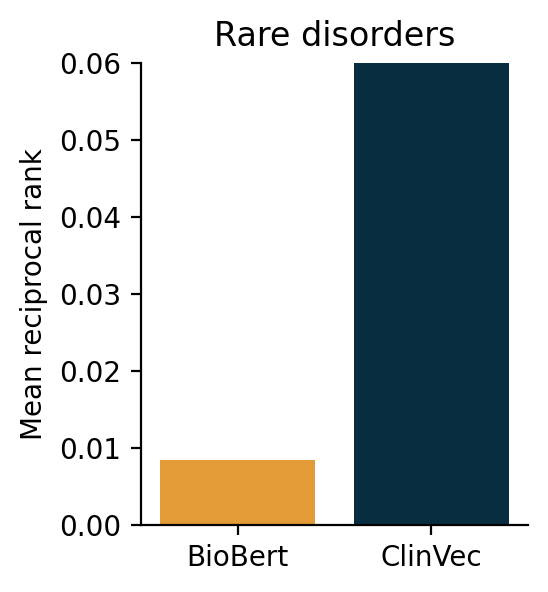

In [19]:
fig, ax = plt.subplots(figsize=(2.5, 3))
sns.barplot(x=['ClinVec', 'BioBert'][::-1], y=[phekg_mrr, bert_mrr][::-1], hue=['BioBert', 'ClinVec'],
             palette=['#ff9f1c', '#003049'])

sns.despine(top=True)

#plt.yticks(np.arange(0, 0.045, 0.01))
plt.ylim(0, 0.06)
plt.ylabel("Mean reciprocal rank")
plt.title("Rare disorders")

Text(0.5, 0, '')

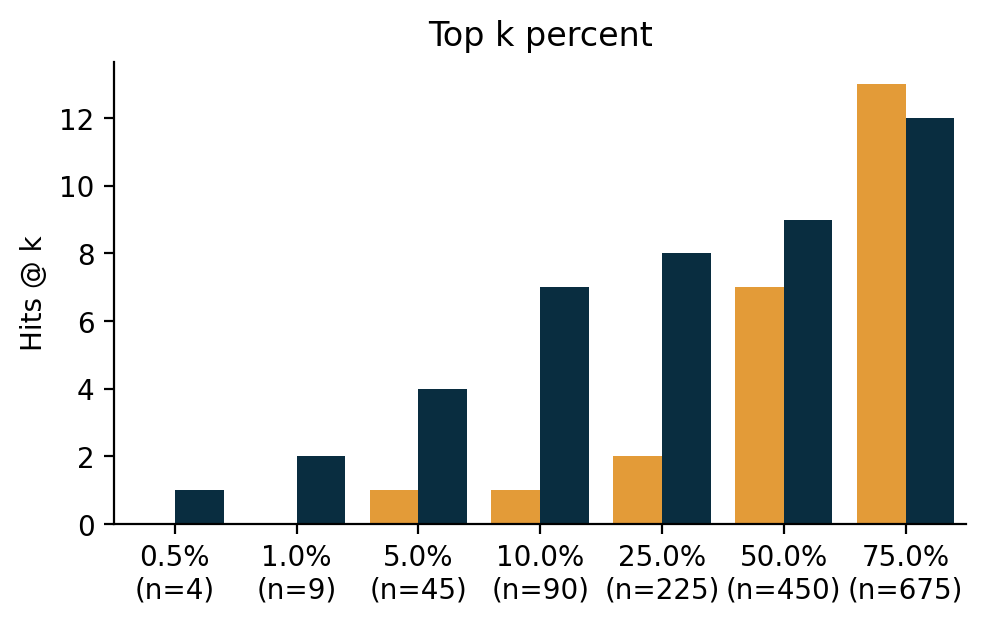

In [21]:
fig, ax = plt.subplots(figsize=(5.5, 3))

k_list = [int(len(final_cui_ids) * p) for p in percent_list]

sns.barplot(data=rare_plot_df.sort_values(by='variable'), x='k', y='value', 
            hue='variable', legend=False, palette=['#ff9f1c', '#003049'])

plt.xticks(range(0, len(percent_list)), [str(x*100)+'%'+'\n(n={})'.format(y) for x,y in zip(percent_list, k_list)])
sns.despine(top=True)
plt.title("Top k percent")
plt.ylabel("Hits @ k")
#plt.ylim(0, 10)
plt.xlabel("")

In [11]:
phekg_icd_embed_df.head()

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
R10.0,-2.669304,-6.838464,3.118489,1.318246,-1.822881,6.778866,0.695468,-5.794669,-4.969514,-8.850422,...,6.638722,3.022308,7.485793,-7.156237,-1.833859,-8.582132,-0.137967,-2.860171,7.111708,-5.554851
E78.6,-1.377928,-2.882770,-0.693204,4.211953,2.619791,3.986688,3.097343,-1.781580,-2.328304,-5.679584,...,4.206887,-2.120195,0.788027,-3.295194,1.344874,-2.133463,0.246596,-2.828051,1.705068,0.535451
K00.2,2.173484,1.986208,2.287434,2.187093,3.029092,-2.166725,3.645931,3.929310,-0.056680,3.072851,...,-2.636241,-3.310765,-2.558162,-1.774094,1.576855,1.213080,-3.111786,3.767154,1.755520,-1.438867
Q89.7,-2.579448,-3.615320,-1.347728,-0.797684,0.840461,3.201521,-1.533517,-4.713916,-2.297775,-4.192291,...,4.658504,2.778338,5.201476,-3.466687,0.147125,-5.739940,-1.139598,-2.416512,1.825625,-1.153981
O03,-2.000906,-6.508976,2.787733,2.410108,3.099899,5.744215,2.690458,-6.531832,-6.313118,-9.366343,...,7.266761,2.637944,8.133494,-10.853182,1.477719,-12.579514,-3.841309,-1.733845,8.960320,-5.639302


In [12]:
import umap 

short_icd_ids = [x for x in phekg_icd_dict.keys() if ((len(x) <= 6) & (x[0] not in ['S', 'U', 'V', 'Z']))]
df = pd.concat([phekg_cui_embed_df, phekg_icd_embed_df.loc[phekg_icd_embed_df.index.isin(short_icd_ids)]])

2026-01-12 20:14:48.881702: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-12 20:14:48.957988: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [14]:
phekg_cui_embed_df.shape

(42883, 128)

In [15]:
reducer = umap.UMAP(n_neighbors=200, min_dist=0.85, metric='cosine', n_components=2)
embedding_standard = reducer.fit_transform(df.values)
umap_df = pd.DataFrame(embedding_standard)

In [104]:
target = 'C0024796'

cos_col = cosine_similarity(df.values, phekg_cui_dict[target].reshape(1, -1))
umap_df['cos'] = cos_col.ravel()
umap_df['pheno'] = list(df.index)

In [109]:
symptom_list = hpo_phecode_annot_df.loc[hpo_phecode_annot_df['CUI'] == target]['hpo_cui'].astype(str).unique().tolist()

umap_df.loc[umap_df['pheno'].isin(symptom_list)].merge(hpo_phecode_annot_df[['hpo_cui', 'hpo_str']].drop_duplicates(), left_on='pheno', right_on='hpo_cui')

,0,1,cos,pheno,hpo_cui,hpo_str
0,-4.970473,9.238838,0.938696,C0443147,C0443147,Autosomal dominant inheritance
1,-4.323256,5.786991,0.889054,C0241240,C0241240,Tall stature
2,-4.171724,5.278234,0.482567,C0423224,C0423224,Sunken eye
3,6.247451,12.667337,-0.098297,C0038016,C0038016,Spondylolisthesis
4,-4.254007,14.503674,0.631484,C0038379,C0038379,Strabismus
5,-0.486279,9.736811,-0.062548,C0032326,C0032326,Pneumothorax
6,-4.572737,5.166745,0.361787,C0034067,C0034067,Pulmonary emphysema
7,-3.898324,14.978703,0.562271,C0035305,C0035305,Retinal detachment
8,3.999724,17.904251,-0.331420,C0014877,C0014877,Esotropia
9,13.734540,6.388168,-0.653369,C0015310,C0015310,Exotropia


In [110]:
import plotly.express as px

fig_2d = px.scatter(
    umap_df.loc[umap_df['pheno'].isin(symptom_list)].merge(hpo_phecode_annot_df[['hpo_cui', 'hpo_str']].drop_duplicates(), 
        left_on='pheno', right_on='hpo_cui'),
     x=0, y=1, color='cos',
hover_data=["hpo_str", "cos"], hover_name="hpo_str"
)

# hover name
fig_2d.update_layout(
    width=800,
    height=600,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [95]:
umap_df.head()

,0,1,cos,pheno
0,15.346287,8.257594,-0.673833,C0434514
1,4.580019,15.521686,-0.168174,C0434873
2,14.821028,2.227150,-0.772188,C0435577
3,13.858936,13.130464,-0.610327,C0435632
4,15.549995,4.128449,-0.738084,C0435943


In [92]:
hpo_phecode_annot_df.head()

,database_id,disease_name,hpo_id,hpo_cui,CUI,OMIM_ID,hpo_str
8466,OMIM:200100,ABETALIPOPROTEINEMIA,HP:0008181,C0000744,C0000744,OMIM:200100,Abetalipoproteinemia
8465,OMIM:200100,ABETALIPOPROTEINEMIA,HP:0000546,C0035304,C0000744,OMIM:200100,Retinal degeneration
8463,OMIM:200100,ABETALIPOPROTEINEMIA,HP:0001251,C0007758,C0000744,OMIM:200100,Cerebellar ataxia
8462,OMIM:200100,ABETALIPOPROTEINEMIA,HP:0001927,C0687751,C0000744,OMIM:200100,Acanthocytosis
4526,OMIM:100600,Acanthosis nigricans,HP:0000006,C0443147,C0000889,OMIM:100600,Autosomal dominant inheritance


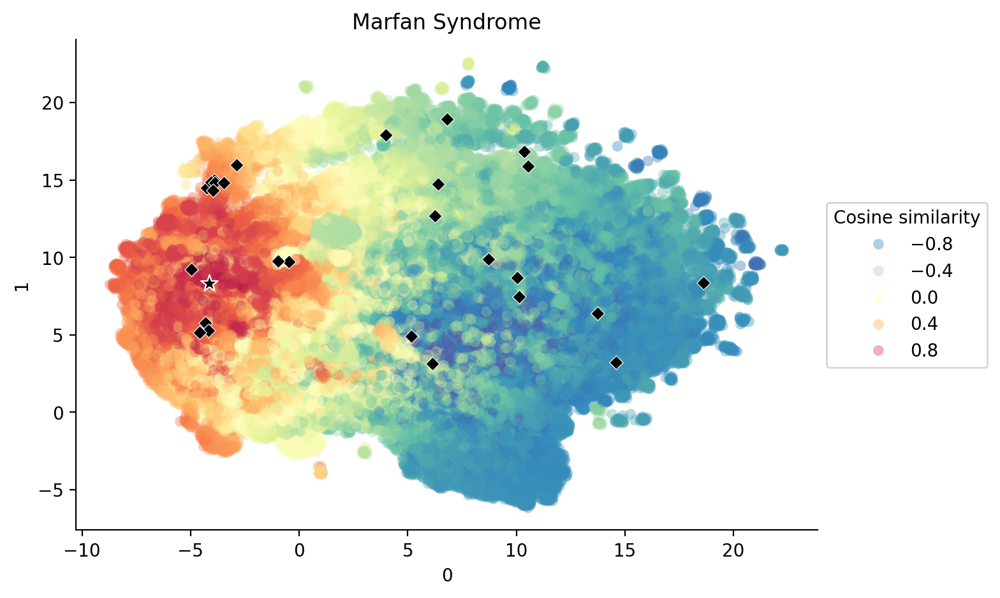

In [101]:
fig, ax = plt.subplots(figsize=(7.5, 5))

sns.scatterplot(data=umap_df, x=0, y=1, hue='cos', alpha=0.4, palette='Spectral_r', lw=0, legend=True)
for collection in ax.collections:
    collection.set_rasterized(True)

sns.scatterplot(data=umap_df.loc[umap_df['pheno'] == target], x=0, y=1, marker='*', color='black', s=100)

symptom_list = hpo_phecode_annot_df.loc[hpo_phecode_annot_df['CUI'] == target]['hpo_cui'].astype(str).unique().tolist()
sns.scatterplot(data=umap_df.loc[umap_df['pheno'].isin(symptom_list)], x=0, y=1, marker='D', color='black', s=30)

sns.move_legend(
    ax,
    "center left",
    bbox_to_anchor=(1, 0.5), # Anchor point at the right middle of the axes
    title="Cosine similarity"
)

plt.title("Marfan Syndrome")

sns.despine(top=True)

plt.savefig('marfan_umap.svg', dpi=300)

In [111]:
disease_list = [("Grave's", 'E05.0', graves_list), ("Lupus", 'M32.9', lupus_list), 
            ("MS", 'G35', ms_list), ("Crohns", 'K50.00', crohns_list), 
                ("Heart disease", 'I11', heart_disease_list),
               ("Stroke", "I63", stroke_list),
               ("COPD", "J44.0", copd_list),
               ("Lung cancer", "C34.90", lung_cancer_list),
               ("Dementia", "F03", dementia_list)]

target = 'M32.9'

cos_col = cosine_similarity(df.values, phekg_icd_dict[target].reshape(1, -1))
umap_df['cos'] = cos_col.ravel()
umap_df['pheno'] = list(df.index)

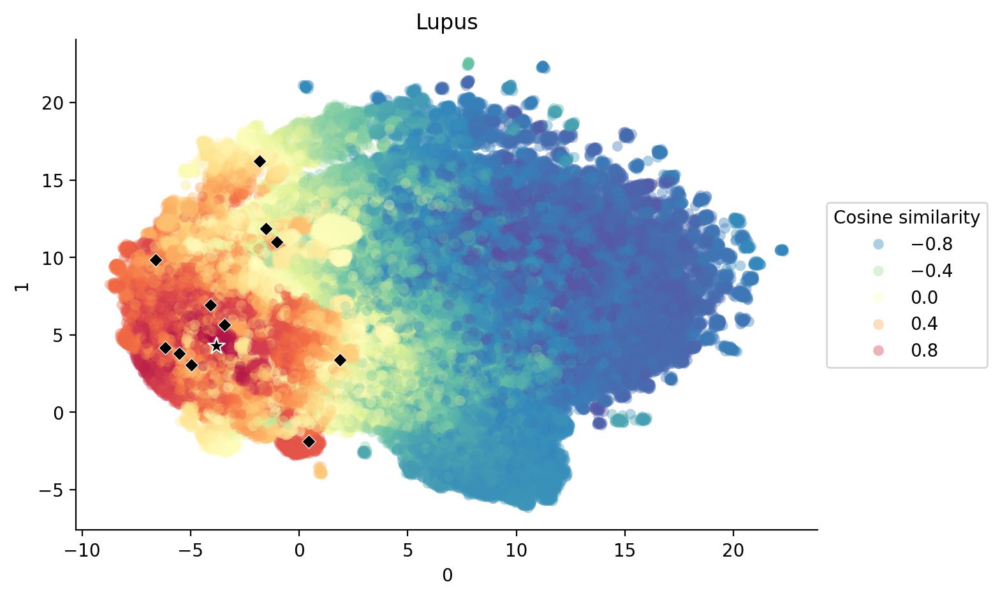

In [112]:
symptom_list = list(lupus_list)

fig, ax = plt.subplots(figsize=(7.5, 5))

sns.scatterplot(data=umap_df, x=0, y=1, hue='cos', alpha=0.4, palette='Spectral_r', lw=0, legend=True)
for collection in ax.collections:
    collection.set_rasterized(True)

sns.scatterplot(data=umap_df.loc[umap_df['pheno'] == target], x=0, y=1, marker='*', color='black', s=100)
sns.scatterplot(data=umap_df.loc[umap_df['pheno'].isin(symptom_list)], x=0, y=1, marker='D', color='black', s=30)

sns.move_legend(
    ax,
    "center left",
    bbox_to_anchor=(1, 0.5), # Anchor point at the right middle of the axes
    title="Cosine similarity"
)

plt.title("Lupus")

sns.despine(top=True)
plt.savefig('lupus_umap.svg', dpi=300)

In [117]:
phekg_node_df = pd.read_csv("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/connected_node_v3_df.csv", sep='\t')
phekg_node_df['original_code'] = phekg_node_df['node_id'].str.split(':', expand=True)[0]
phekg_node_df.head()

,node_id,node_name,ntype,node_index,original_code
0,789.0:icd9cm,Abdominal pain,ICD9CM,0,789.0
1,520.2:icd9cm,Abnormalities of size and form of teeth,ICD9CM,1,520.2
2,251.5:icd9cm,Abnormality of secretion of gastrin,ICD9CM,2,251.5
3,634:icd9cm,Spontaneous abortion,ICD9CM,3,634
4,632:icd9cm,Missed abortion,ICD9CM,4,632


In [118]:
import plotly.express as px

fig_2d = px.scatter(
    umap_df.loc[umap_df['pheno'].isin(symptom_list)].merge(phekg_node_df, left_on='pheno', right_on='original_code'), 
     x=0, y=1, color='cos',
hover_data=["node_name", "cos"],
)

# hover name
fig_2d.update_layout(
    width=800,
    height=600,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [183]:
target ='C0010674'
#symptom_list = disease_list[1][2]
symptom_list = hpo_phecode_annot_df.loc[hpo_phecode_annot_df['CUI'] == target]['hpo_cui'].astype(str).unique().tolist()[0:10]

x = np.zeros((1, 128))
cos_list = []

for s in symptom_list:
    x += phekg_cui_dict[s]
    cos_col = cosine_similarity(x, phekg_cui_dict[target].reshape(1, -1)).ravel()[0]
    print(cos_col)
    cos_list.append(cos_col)

0.7117328550699769
0.5267831893167115
0.7254851511891819
0.8256022982623816
0.7758360618946497
0.6861844871301417
0.650895248556371
0.7222320907346755
0.7848222263647648
0.8539736644756295


(0.5, 1.01)

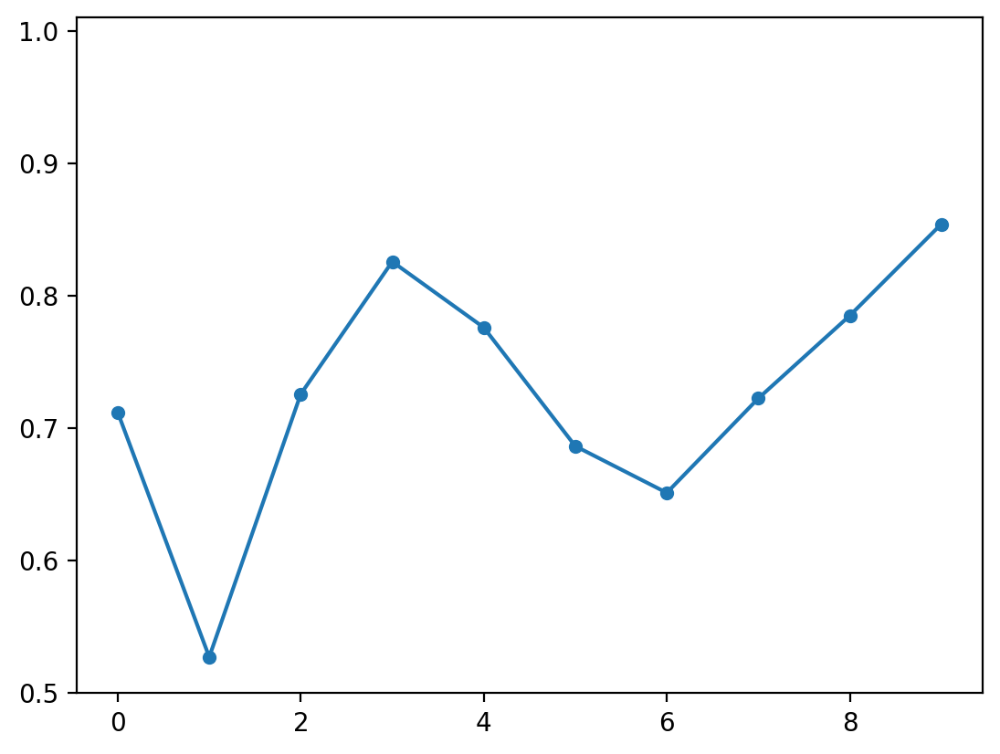

In [184]:
sns.lineplot(x=range(0, len(symptom_list)), y=cos_list)
sns.scatterplot(x=range(0, len(symptom_list)), y=cos_list)
plt.ylim(0.5, 1.01)

# Chronic diseases

In [3]:
heart_disease_list = ["M25.60","I20.8", "R07.1",  "G57"]
stroke_list = ["G44.89","G57","R27.8", "G83.8","R47.02",  "H53.13"]
copd_list = ["R06.0", "R06.2", "R07.8", "R05", "J06.9", "R53", "R63.6", "R60.1"]
lung_cancer_list = ["R05", "R07.8", "R04.2",  "R06.0","R49.0", "R06.2"]
dementia_list = [ "F51.8","F32","R41.3","F22","R41.9","F06.30","R41.840"]

crohns_list = ["R19.7", "R50.9", "R53", "R10.84", "K92.1", "K12.39", "R63.0", "R63.6", "K60.3"]

lupus_list = ["R50.9", "R53", "M25.50", "L93.1", "L56.3", "I73.0", "R06.0", "I20.8", "H04.12", "G44", "R41.9"]

graves_list = ["R00.2", "R63.6", "R53", "R19.8", "N92.6", "E04.9", "N52.8", "R68.89", "H05.25", "R41.0", "R41.82", "T67.9"]

ms_list = ["M54.1", "G83", "R42", "R53", "H53", "R27", "N53", "R47.8", "H53.3", "N39.41", "F98.1", "R41.82", "G57", "R41.9", "K58", "M62.81"]
#["G57", 'R53',  "R41.0", "H54.10", "H53",  "R42", "N53",  "N39.41", "R41.82", "R47.8", "M54.1", "K58", "H53.3", "R15", "F98.1", "R27", "R26.9"]

disease_list = [("Grave's", 'E05.0', graves_list), ("Lupus", 'M32.9', lupus_list), 
            ("MS", 'G35', ms_list), ("Crohns", 'K50.00', crohns_list), 
                ("Heart disease", 'I11', heart_disease_list),
               ("Stroke", "I63", stroke_list),
               ("COPD", "J44.0", copd_list),
               ("Lung cancer", "C34.90", lung_cancer_list),
               ("Dementia", "F03", dementia_list)]

In [4]:
disease_df_list = []

for tup in disease_list:
    disease_name = tup[0]
    icd_list = tup[2]

    icd_df = pd.DataFrame({'icd': icd_list})
    
    for compare_tup in disease_list:
        disease_compare_name = compare_tup[0]
        disease_ind = compare_tup[1]
        
        running_h = np.zeros((1, 128))
        disease_h = phekg_icd_dict[disease_ind]
        cos_list = []
        ind_list = []
        i = 0
        for code in icd_df['icd'].tolist():
            running_h = running_h + phekg_icd_dict[code]
            c = cosine_similarity([disease_h], running_h)
            cos_list.append(c[0][0])
            i += 1
            ind_list.append(i)

        icd_df['cos'] = cos_list
        icd_df['disease'] = disease_name
        icd_df['compare_disease'] = disease_compare_name
        icd_df['ind'] = ind_list
        
        disease_df_list.append(icd_df.copy())

all_disease_df = pd.concat(disease_df_list)

zero_df = pd.DataFrame({'disease': ["Grave's"]*4, 'compare_disease':["Grave's", "MS", "Crohns", "Lupus"], 'ind':[0]*4, 'cos':[0]*4})
all_disease_df = pd.concat([zero_df, all_disease_df])

zero_df = pd.DataFrame({'disease': ["MS"]*4, 'compare_disease':["Grave's", "MS", "Crohns", "Lupus"], 'ind':[0]*4, 'cos':[0]*4})
all_disease_df = pd.concat([zero_df, all_disease_df])

zero_df = pd.DataFrame({'disease': ["Lupus"]*4, 'compare_disease':["Grave's", "MS", "Crohns", "Lupus"], 'ind':[0]*4, 'cos':[0]*4})
all_disease_df = pd.concat([zero_df, all_disease_df])

zero_df = pd.DataFrame({'disease': ["Crohns"]*4, 'compare_disease':["Grave's", "MS", "Crohns", "Lupus"], 'ind':[0]*4, 'cos':[0]*4})
all_disease_df = pd.concat([zero_df, all_disease_df])

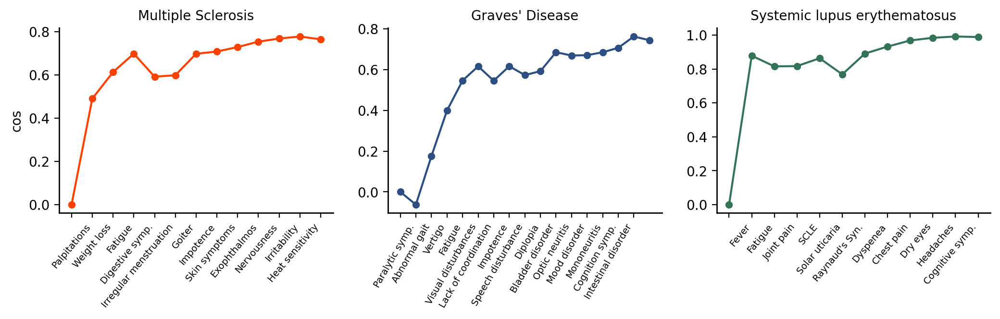

In [63]:
icd_names = [' ', 'Palpitations', 'Weight loss', 'Fatigue', "Digestive symp.", "Irregular menstruation", 'Goiter', 'Impotence',
              'Skin symptoms', 'Exophthalmos', 'Nervousness', 'Irritability', 'Heat sensitivity']

pal = ['#FC4100', '#FFC55A', '#2C4E80', '#337357']

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12.5, 2.5), sharey=False)

sns.lineplot(data=all_disease_df.loc[(all_disease_df['disease'] == "Grave's") & 
                                     (all_disease_df['compare_disease'] == "Grave's")], 
                                     x='ind', y='cos', color=pal[0], ax=ax[0])

sns.scatterplot(x=all_disease_df.loc[(all_disease_df['disease'] == "Grave's") & 
                                     (all_disease_df['compare_disease'] == "Grave's")]['ind'],
                                     y=all_disease_df.loc[(all_disease_df['disease'] == "Grave's") & 
                                     (all_disease_df['compare_disease'] == "Grave's")]['cos'], color=pal[0], ax=ax[0])

ax[0].set_xticks(range(0, len(icd_names)), icd_names, ha='right', fontsize=7)
ax[0].tick_params(axis='x', labelrotation=50)

####################

disease_name = "MS"
icd_list = list(ms_list)

icd_names = [' ', 'Paralytic symp.', 'Abnormal gait', 'Vertigo',
       'Fatigue', 'Visual disturbances',
       'Lack of coordination', 'Impotence',
       'Speech disturbance', 'Diplopia',
       'Bladder disorder', 'Optic neuritis',
       'Mood disorder',
       'Mononeuritis',
       'Cognition symp.',
       'Intestinal disorder']

sns.lineplot(data=all_disease_df.loc[(all_disease_df['disease'] == "MS") & 
                                     (all_disease_df['compare_disease'] == "MS")], 
                                     x='ind', y='cos', color=pal[2], ax=ax[1])

sns.scatterplot(x=all_disease_df.loc[(all_disease_df['disease'] == "MS") & 
                                     (all_disease_df['compare_disease'] == "MS")]['ind'],
                                     y=all_disease_df.loc[(all_disease_df['disease'] == "MS") & 
                                     (all_disease_df['compare_disease'] == "MS")]['cos'], color=pal[2], ax=ax[1])

ax[1].set_xticks(range(0, len(icd_names)), icd_names, ha='right', fontsize=7)
ax[1].tick_params(axis='x', labelrotation=60)

########################

disease_name = "Lupus"
icd_list = list(lupus_list)

icd_names = [
    " ",
    "Fever",
    "Fatigue",
    "Joint pain",
    "SCLE",
    "Solar uticaria",
    "Raynaud's Syn.",
    "Dyspenea",
    "Chest pain",
    "Dry eyes",
    "Headaches",
    "Cognitive symp."
]

sns.lineplot(data=all_disease_df.loc[(all_disease_df['disease'] == "Lupus") & 
                                     (all_disease_df['compare_disease'] == "Lupus")], 
                                     x='ind', y='cos', color=pal[3], ax=ax[2])

sns.scatterplot(x=all_disease_df.loc[(all_disease_df['disease'] == "Lupus") & 
                                     (all_disease_df['compare_disease'] == "Lupus")]['ind'],
                                     y=all_disease_df.loc[(all_disease_df['disease'] == "Lupus") & 
                                     (all_disease_df['compare_disease'] == "Lupus")]['cos'], color=pal[3], ax=ax[2])

ax[2].set_xticks(range(0, len(icd_names)), icd_names, ha='right', fontsize=7)
ax[2].tick_params(axis='x', labelrotation=50)

ax[0].set_xlabel("")
ax[1].set_xlabel("")
ax[2].set_xlabel("")

ax[1].set_ylabel("")
ax[2].set_ylabel("")

ax[0].set_title("Multiple Sclerosis", fontsize=10)
ax[1].set_title("Graves' Disease", fontsize=10)
ax[2].set_title("Systemic lupus erythematosus", fontsize=10)

#ax.set_xlim(-0.2)
#ax.set_ylim(-1, 1)
#ax.set_ylabel("Cosine similarity with Graves' disease")
#ax.set_xlabel("Symptoms of Graves' disease")

sns.despine(right=True, top=True)

#fig.subplots_adjust(hspace=0, wspace=0.01)

#plt.tight_layout()

In [23]:
final_icd_ids = [x for x in list(phekg_icd_dict.keys()) if (len(x) <= 10)]
len(final_icd_ids)

34842

In [24]:
phekg_min_list = []

for i in tqdm(range(0, len(disease_list))):
    target = disease_list[i][1]
    if target in final_icd_ids:
        symptom_list = disease_list[i][2]
        #print(len(symptom_list))
        sort_df = top_disease(phekg_icd_embed_df.loc[phekg_icd_embed_df.index.isin(final_icd_ids)], 
                              phekg_icd_dict, symptom_list)
        if '.' in target:
            target = target.split('.')[0]

        min_ind = (sort_df.loc[sort_df['index'].str.startswith(target)].index.min())
        print(target, min_ind)
        phekg_min_list.append(min_ind)

  0%|          | 0/9 [00:00<?, ?it/s]

E05 226
M32 0
G35 890
K50 168
I11 188
I63 1108
J44 9
C34 854
F03 331


In [25]:
bert_icd_dict = open_pickle("/n/home01/ruthjohnson/ruthjohnson/kg_paper_revision/icd10cm_bert_dict.pkl")

emb_list = []

for k in bert_icd_dict.keys():
    emb_list.append(bert_icd_dict[k])

bert_icd_embed_df = pd.DataFrame(emb_list, index=bert_icd_dict.keys())

In [26]:
phekg_node_df = pd.read_csv("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/connected_node_v3_df.csv", sep='\t')
phekg_node_df['original_code'] = phekg_node_df['node_id'].str.split(':', expand=True)[0]

symptom_embed_dict = {}

for tup in disease_list:
    k = tup[1] + '_symptoms'
    symptom_df = phekg_node_df.loc[phekg_node_df['original_code'].isin(tup[2])]
    desc = symptom_df.groupby('ntype')['node_name'].agg("; ".join).reset_index()['node_name'].values[0]
    symptom_embed_dict[k] = get_word_embedding(desc)

In [27]:
bert_min_list = []

for i in tqdm(range(0, len(disease_list))):
    target = disease_list[i][1]
    symptom_list = [target+'_symptoms']
    sort_df = top_disease(bert_icd_embed_df.loc[bert_icd_embed_df.index.isin(final_icd_ids)], symptom_embed_dict, symptom_list)

    if '.' in target:
        target = target.split('.')[0]

    min_ind = (sort_df.loc[sort_df['index'].str.startswith(target)].index.min())
    print(target, min_ind)
    bert_min_list.append(min_ind)

  0%|          | 0/9 [00:00<?, ?it/s]

E05 2125
M32 125
G35 33871
K50 338
I11 20302
I63 320
J44 0
C34 56
F03 615


In [70]:
results_df = pd.DataFrame({'phekg': phekg_min_list, 'bert': bert_min_list}).dropna()

plot_list = []

for k in [25, 50, 100, 200, 500, 1000]:
    n1 = results_df.loc[results_df['phekg'] < k].shape[0]
    n2 = results_df.loc[results_df['bert'] < k].shape[0]
    print(k, n1, n2)
    plot_list.append([k, n1, n2])
    
plot_df = pd.DataFrame(plot_list, columns=['k', 'phekg', 'bert']).melt(id_vars='k', value_vars=['phekg', 'bert'])

25 2 1
50 2 1
100 2 2
200 4 3
500 6 5
1000 8 6


In [28]:
results_df = pd.DataFrame({'phekg': phekg_min_list, 'bert': bert_min_list}).dropna()

plot_list = []
percent_list = [0.005, 0.01, 0.05, 0.10, 0.25, 0.5, 0.75]

for p in percent_list:
    k = int(len(final_icd_ids) * p)
    n1 = results_df.loc[results_df['phekg'] < k].shape[0]
    n2 = results_df.loc[results_df['bert'] < k].shape[0]
    print(k, n1, n2)
    plot_list.append([k, n1, n2])
    
chronic_plot_df = pd.DataFrame(plot_list, columns=['k', 'phekg', 'bert']).melt(id_vars='k', value_vars=['phekg', 'bert'])

174 3 3
348 6 5
1742 9 6
3484 9 7
8710 9 7
17421 9 7
26131 9 8


Text(0.5, 1.0, 'Chronic diseases')

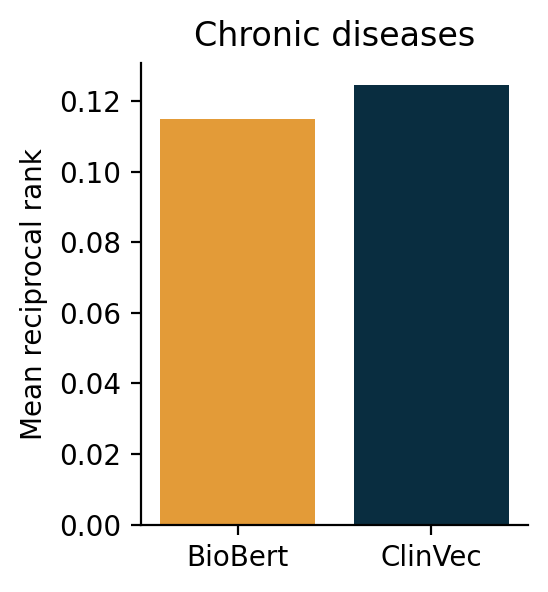

In [32]:
phekg_mrr = mean_reciprocal_rank([x+1 for x in phekg_min_list])
bert_mrr = mean_reciprocal_rank([x+1 for x in bert_min_list])

fig, ax = plt.subplots(figsize=(2.5, 3))
sns.barplot(x=['ClinVec', 'BioBert'][::-1], y=[phekg_mrr, bert_mrr][::-1], hue=['BioBert', 'ClinVec'],
             palette=['#ff9f1c', '#003049'])

sns.despine(top=True)

#plt.yticks(np.arange(0, 0.045, 0.01))
#plt.ylim(0, 0.06)
plt.ylabel("Mean reciprocal rank")
plt.title("Chronic diseases")

Text(0.5, 0, '')

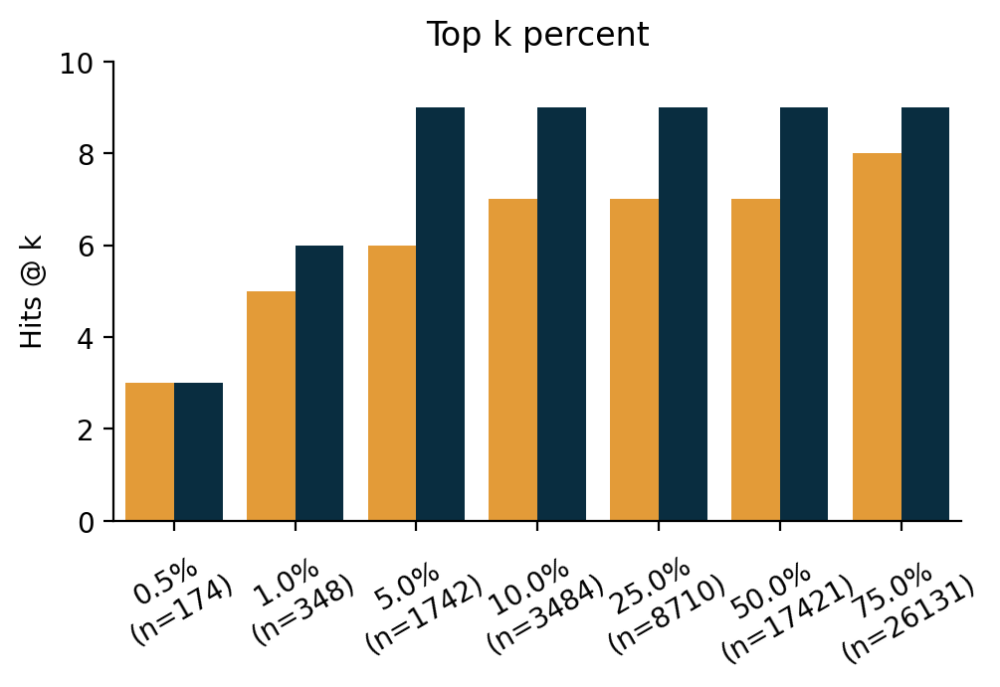

In [29]:
fig, ax = plt.subplots(figsize=(5.5, 3))

k_list = [int(len(final_icd_ids) * p) for p in percent_list]

sns.barplot(data=chronic_plot_df.sort_values(by='variable'), x='k', y='value', 
            hue='variable', legend=False, palette=['#ff9f1c', '#003049'])

plt.xticks(range(0, len(percent_list)), 
           [str(x*100)+'%'+'\n(n={})'.format(y) for x,y in zip(percent_list, k_list)],
           rotation=30)
sns.despine(top=True)
plt.title("Top k percent")
plt.ylabel("Hits @ k")
plt.ylim(0, 10)
plt.xlabel("")

In [112]:
short_icd_ids = [x for x in phekg_icd_dict.keys() if ((len(x) <= 10) & (x[0] not in ['S', 'U', 'V', 'Z']))]

In [203]:
import umap 

reducer = umap.UMAP(n_neighbors=50, min_dist=0.5, metric='cosine', n_components=2)
embedding_standard = reducer.fit_transform(phekg_icd_embed_df.loc[phekg_icd_embed_df.index.isin(short_icd_ids)].values)
umap_df = pd.DataFrame(embedding_standard)

In [130]:
disease_list[0]

("Grave's",
 'E05.0',
 ['R00.2',
  'R63.6',
  'R53',
  'R19.8',
  'N92.6',
  'E04.9',
  'N52.8',
  'R68.89',
  'H05.25',
  'R41.0',
  'R41.82',
  'T67.9'])

In [204]:
target = 'M32.9'

cos_col = cosine_similarity(phekg_icd_embed_df.loc[phekg_icd_embed_df.index.isin(short_icd_ids)].values, phekg_icd_dict[target].reshape(1, -1))
umap_df['cos'] = cos_col.ravel()
umap_df['pheno'] = list(phekg_icd_embed_df.loc[phekg_icd_embed_df.index.isin(short_icd_ids)].index)

In [132]:
import plotly.express as px

fig_2d = px.scatter(
    umap_df, x=1, y=0, color='cos',
hover_data=["pheno", "cos"], hover_name="pheno"
)

# hover name
fig_2d.update_layout(
    width=800,
    height=600,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

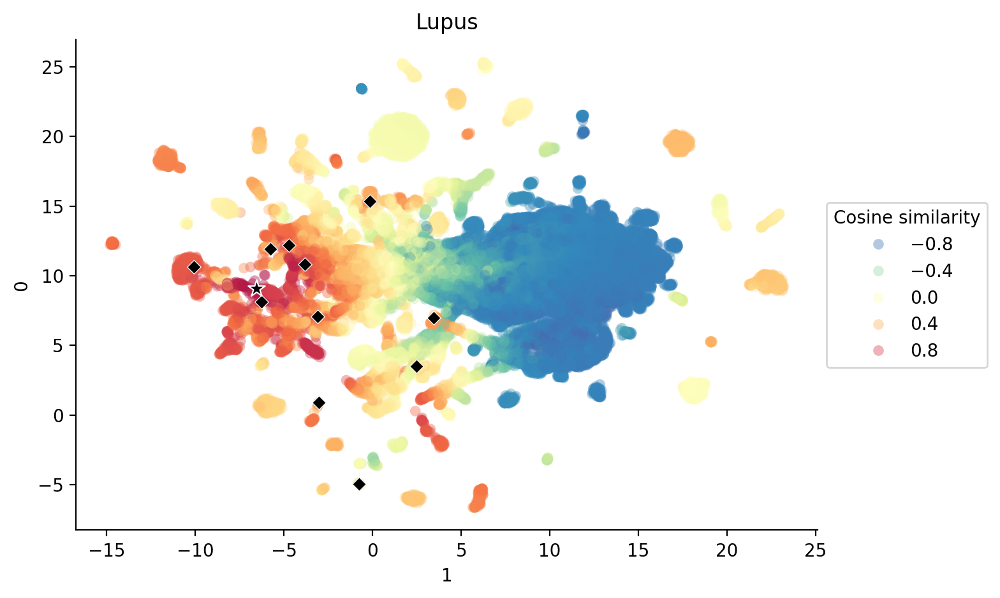

In [206]:
fig, ax = plt.subplots(figsize=(7.5, 5))
sns.scatterplot(data=umap_df, x=1, y=0, hue='cos', alpha=0.4, palette='Spectral_r', lw=0, legend=True)

symptom_list = disease_list[1][2]
sns.scatterplot(data=umap_df.loc[umap_df['pheno'].isin(symptom_list)], x=1, y=0, marker='D', color='black', s=30)
sns.scatterplot(data=umap_df.loc[umap_df['pheno'] == target], x=1, y=0, marker='*', color='black', s=100)
sns.move_legend(
    ax,
    "center left",
    bbox_to_anchor=(1, 0.5), # Anchor point at the right middle of the axes
    title="Cosine similarity"
)
plt.title("Lupus")

sns.despine(top=True)

In [178]:
target = disease_list[1][1]
#symptom_list = disease_list[1][2]
symptom_list = ["R53", "R50.9", "M25.50", "L93.1", "L56.3", "I73.0", "R06.0", "I20.8", "H04.12", "G44", "R41.9"]

x = np.zeros((1, 128))
cos_list = []

for s in symptom_list:
    x += phekg_icd_dict[s]
    cos_col = cosine_similarity(x, phekg_icd_dict[target].reshape(1, -1)).ravel()[0]
    print(cos_col)
    cos_list.append(cos_col)

0.5607873190507997
0.8150985102742327
0.8170137267624447
0.8629808573163888
0.7681788077158449
0.8906970724923139
0.9319650603712423
0.96801486541053
0.9837381404267678
0.9913873942770981
0.9882661802925026


(0.5, 1.01)

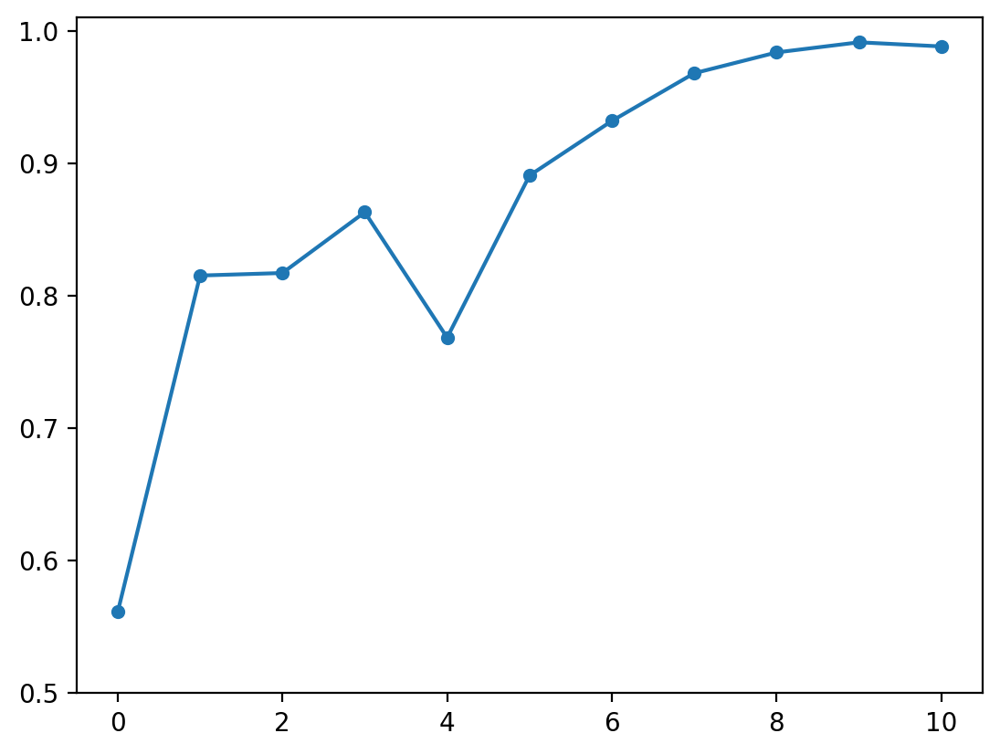

In [180]:
sns.lineplot(x=range(0, len(symptom_list)), y=cos_list)
sns.scatterplot(x=range(0, len(symptom_list)), y=cos_list)
plt.ylim(0.5, 1.01)

In [ ]:
disease_name = "Lupus"
icd_list = list(lupus_list)

# lupus_list = ["R50.9", "R53", "M25.50", "L93.1", "L56.3", "I73.0", "R06.0", "I20.8", "H04.12", "G44", "R41.9"]

icd_names = [
    "No symptoms",
    "Fever",
    "Fatigue",
    "Joint pain",
    "Subacute cutaneous\nlupus erythematosus",
    "Solar uticaria",
    "Raynaud's syndrome",
    "Shortness of breath",
    "Chest pain",
    "Dry eyes",
    "Headaches",
    "Symptoms of\ncognitive functions"
]

pal = ['#FC4100', '#FFC55A', '#2C4E80', '#337357']

fig, ax = plt.subplots(figsize=(6, 5))

sns.lineplot(data=all_disease_df.loc[all_disease_df['disease'] == disease_name], x='ind', y='cos', 
             hue='compare_disease', linestyle='--', palette=pal, ax=ax,
             hue_order=["Grave's", "Lupus", "MS", "Crohns"])

sns.lineplot(data=all_disease_df.loc[(all_disease_df['disease'] == disease_name) & 
                                     (all_disease_df['compare_disease'] == disease_name)], 
                                     x='ind', y='cos', color=pal[1], ax=ax)

sns.scatterplot(data=all_disease_df.loc[all_disease_df['disease'] == disease_name], x='ind', y='cos', 
                hue='compare_disease', s=60, palette=pal, ax=ax,
                hue_order=["Grave's", "Lupus", "MS", "Crohns"])

ax.scatter(x=all_disease_df.loc[(all_disease_df['disease'] == disease_name) & 
                                     (all_disease_df['compare_disease'] == disease_name)]['ind'],
                                     y=all_disease_df.loc[(all_disease_df['disease'] == disease_name) & 
                                     (all_disease_df['compare_disease'] == disease_name)]['cos'], color=pal[1])

ax.set_xticks(range(0, len(icd_names)), icd_names, ha='right', fontsize=9)
ax.tick_params(axis='x', labelrotation=35)

handler, labeler = ax.get_legend_handles_labels()
hd = [(handler[0],handler[4]),
    (handler[1],handler[5]),
     (handler[2],handler[6]),
     (handler[3],handler[7])]

lab = ["Graves'",'Lupus', 'Multiple sclerosis', "Crohn's"]
ax.legend(hd, lab, loc="upper center", bbox_to_anchor=(0.5, 1.15), 
          ncol=4, fontsize=9)

ax.set_xlim(-0.2)
ax.set_ylim(-1, 1.02)
ax.set_ylabel("Cosine similarity with Lupus")
ax.set_xlabel("Symptoms of Lupus")

sns.despine(right=True, top=True)

plt.tight_layout()

Text(0, 0.5, 'Mean reciprocal rank')

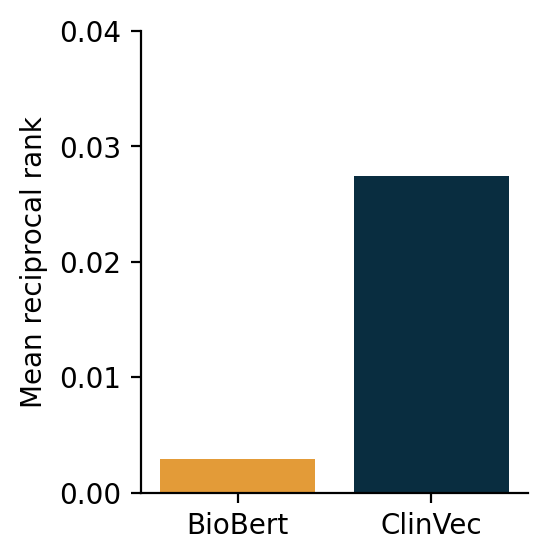

In [71]:
fig, ax = plt.subplots(figsize=(2.5, 3))
sns.barplot(x=['ClinVec', 'BioBert'][::-1], y=[phekg_mrr, bert_mrr][::-1], hue=['BioBert', 'ClinVec'],
             palette=['#ff9f1c', '#003049'])

sns.despine(top=True)

plt.yticks(np.arange(0, 0.045, 0.01))
plt.ylim(0, 0.04)
plt.ylabel("Mean reciprocal rank")

(0.0, 10.0)

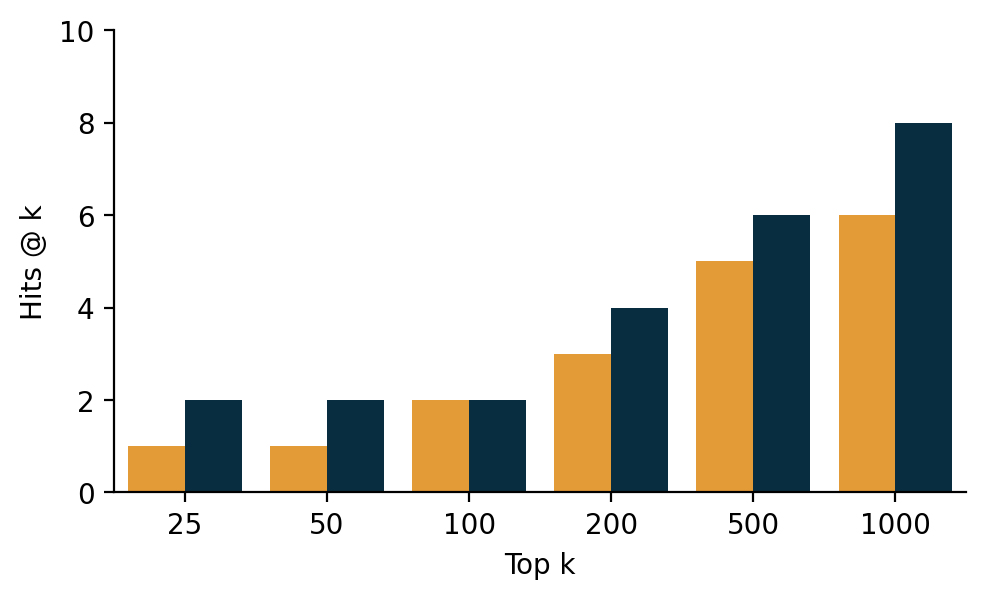

In [72]:
fig, ax = plt.subplots(figsize=(5.5, 3))

sns.barplot(data=plot_df.sort_values(by='variable'), x='k', y='value', 
            hue='variable', legend=False, palette=['#ff9f1c', '#003049'])

sns.despine(top=True)
plt.xlabel("Top k")
plt.ylabel("Hits @ k")
plt.ylim(0, 10)

Text(0, 0.5, 'Hits @ k')

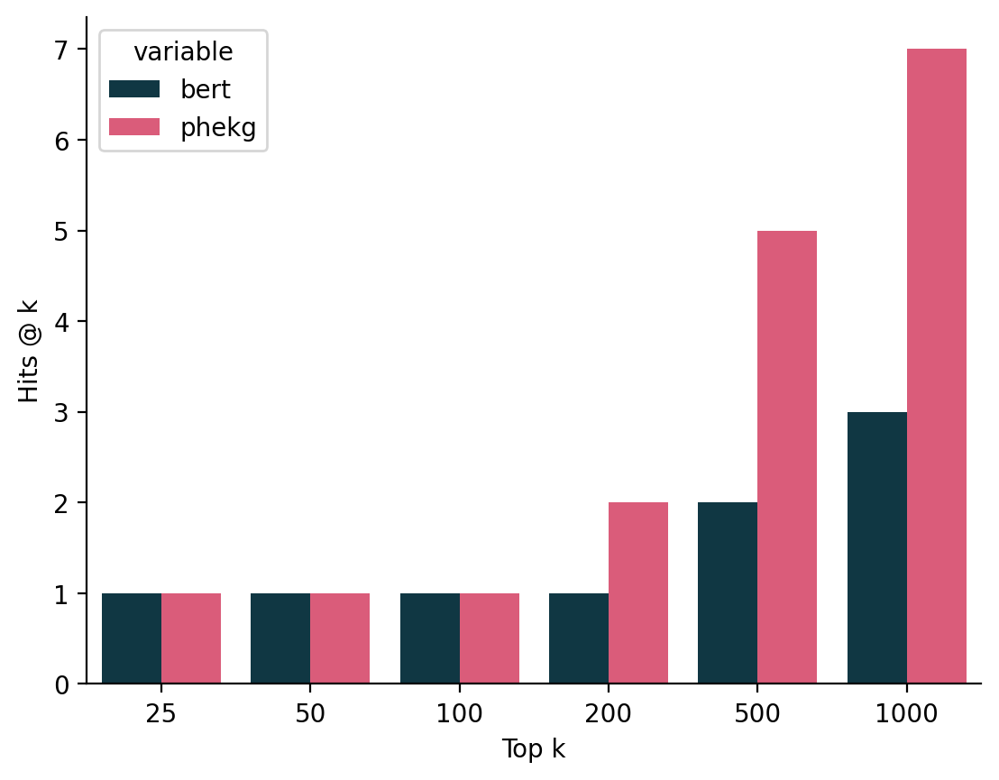

In [155]:
%config InlineBackend.figure_format = 'retina'

sns.barplot(data=plot_df.sort_values(by='variable'), x='k', y='value', hue='variable', 
            palette=['#073b4c', '#ef476f'])
sns.despine(top=True)
plt.xlabel("Top k")
plt.ylabel("Hits @ k")

In [255]:
len(phekg_icd_dict)

34842

## UMAP plots

In [324]:
phekg_icd_keep = [x for x in phekg_icd_dict.keys() if ((len(x) <= 5) & (x[0] not in ['S', 'U', 'V', 'Z']))]
len(phekg_icd_keep)

6505

In [ ]:
phekg_umap_input_list = []

for k in phekg_icd_keep:
    phekg_umap_input_list.append(phekg_icd_dict[k])

for k in phekg_phecode_dict:
    phekg_umap_input_list.append(phekg_phecode_dict[k])

phekg_umap_input_mat = np.array(phekg_umap_input_list)

col_names = phekg_icd_keep + list(phekg_phecode_dict.keys())

In [326]:
import umap 
reducer = umap.UMAP(n_neighbors=200, min_dist=0.25, metric='cosine', n_components=3)
embedding_standard = reducer.fit_transform(phekg_umap_input_mat)

umap_df = pd.DataFrame(embedding_standard)

In [ ]:
import umap
import plotly.express as px


target = 'E05.00'
cos_col = cosine_similarity(phekg_umap_input_mat, phekg_icd_dict[target].reshape(1, -1))
umap_df['cos'] = cos_col.ravel()
umap_df['pheno'] = col_names

<Axes: xlabel='1', ylabel='2'>

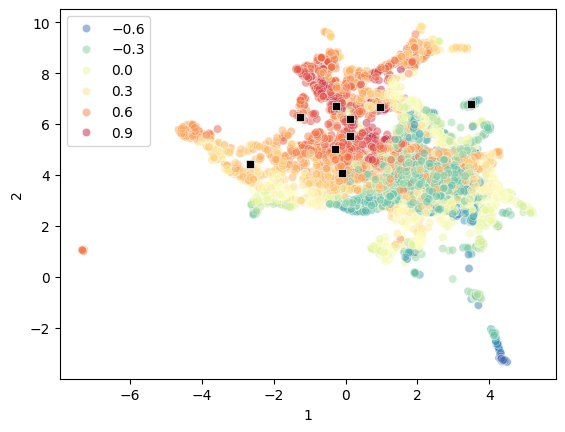

In [368]:
sns.scatterplot(data=umap_df, x=1, y=2, hue='cos', alpha=0.5, palette='Spectral_r')
sns.scatterplot(data=umap_df.loc[umap_df['pheno'].isin(["R00.2", "R63.6", "R53", "R19.8", "N92.6", "E04.9", "N52.8", "R68.89", "H05.25", "R41.0", "R41.82", "T67.9"])],
 x=1, y=2, marker='s', color='black')

Text(0.5, 1.0, 'Graves: E05.00')

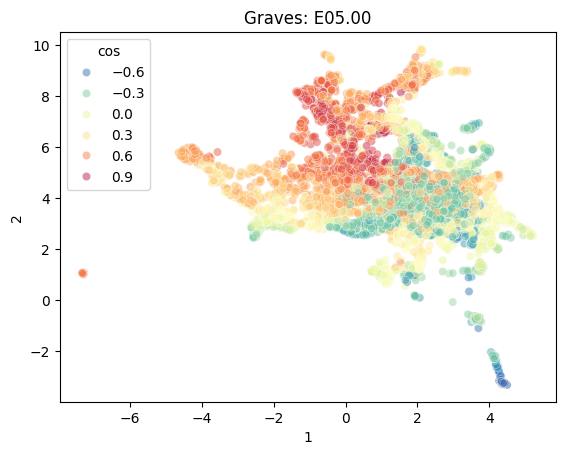

In [369]:
sns.scatterplot(data=umap_df, x=1, y=2, hue='cos', alpha=0.5, palette='Spectral_r')
plt.title("Graves: E05.00")

In [2]:
phekg_cui_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_cui_dict.pkl")
phekg_icd_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_icd_dict.pkl")
phekg_icd9_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_icd9_dict.pkl")
phekg_atc_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_atc_dict.pkl")
phekg_snomed_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_snomed_dict.pkl")
phekg_phecode_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_phecode_dict.pkl")
phekg_rxnorm_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_rxnorm_dict.pkl")
phekg_lnc_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_lnc_dict.pkl")
phekg_cpt_dict = open_pickle("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/benchmarks/data/phekg_cpt_dict.pkl")

phekg_all_dict = {
    'UMLS_CUI': phekg_cui_dict,
    'ICD10CM': phekg_icd_dict,
    'ICD9CM': phekg_icd9_dict,
    'SNOMEDCT_US': phekg_snomed_dict,
    'RXNORM': phekg_rxnorm_dict, 
    'ATC': phekg_atc_dict,
    'PHECODE': phekg_phecode_dict,
    'LNC': phekg_lnc_dict,
    'CPT': phekg_cpt_dict
}

In [3]:
phekg_node_df = pd.read_csv("/n/holylfs06/LABS/mzitnik_lab/Lab/ruthjohnson/kg_paper_revision/connected_node_v3_df.csv", sep='\t')
phekg_node_df['original_code'] = phekg_node_df['node_id'].str.split(':', expand=True)[0]